# Tarea N°01

## Instrucciones

1.- Completa tus datos personales (nombre y rol USM) en siguiente celda.


* __Nombre__: Andrés Ignacio Montecinos López

* __Rol__: 201204515-0

2.- Debes _pushear_ este archivo con tus cambios a tu repositorio personal del curso, incluyendo datos, imágenes, scriptsm, etc.

3.- Se evaluará:
    - Soluciones
    - Código
    - Que Binder esté bien configurado.
    - Al presionar  `Kernel -> Restart Kernel and Run All Cells` deben ejecutarse todas las celdas sin error.

## I.-  Imagenception

Desde [Wikipedia](https://es.wikipedia.org/wiki/RGB), __RGB__ (sigla en inglés de red, green, blue) es un modelo de color basado en la síntesis aditiva, con el que es posible representar un color mediante la mezcla por adición de los tres colores de luz primarios. El modelo de color RGB no define por sí mismo lo que significa exactamente rojo, verde o azul, por lo que los mismos valores RGB pueden mostrar colores notablemente diferentes en distintos dispositivos que usen este modelo de color. Aunque utilicen un mismo modelo de color, sus espacios de color pueden variar considerablemente.

Para indicar con qué proporción es mezclado cada color, se asigna un valor a cada uno de los colores primarios, de manera que el valor "0" significa que no interviene en la mezcla y, a medida que ese valor aumenta, se entiende que aporta más intensidad a la mezcla. Aunque el intervalo de valores podría ser cualquiera (valores reales entre 0 y 1, valores enteros entre 0 y 37, etc.), es frecuente que cada color primario se codifique con un byte (8 bits).

Así, de manera usual, la intensidad de cada una de las componentes se mide según una escala que va del 0 al 255 y cada color es definido por un conjunto de valores escritos entre paréntesis (correspondientes a valores "R", "G" y "B") y separados por comas.

El conjunto de todos los colores también se puede representar en forma de cubo. Cada color es un punto de la superficie o del interior de éste. La escala de grises estaría situada en la diagonal que une al color blanco con el negro.

![rgb](https://upload.wikimedia.org/wikipedia/commons/thumb/a/a9/Avl3119color4a.svg/800px-Avl3119color4a.svg.png)

Para efectos prácticos del curso, es posible representar cada pixel de una imagen con un array de 3 dimensiones, cada valor representa a una de las capas RGB. Por lo tanto, una imagen de $n \times m$ pixeles se representa como un arreglo de dimension $(n, m , 3)$ En `Python` una de las librerías de procesamiento de imágenes más utilizada es `Pillow`.

Abrir una imagen es tan fácil como:

In [1]:
# librerias
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
gatito = Image.open(os.path.join("images", "gatito.png"))

Notar que la variable anterior es de una clase específica de la librería.

In [3]:
type(gatito)

PIL.PngImagePlugin.PngImageFile

Para ver la imagen en Jupyter puedes utilizar la misma técnica que con los `pd.DataFrames`, es decir:

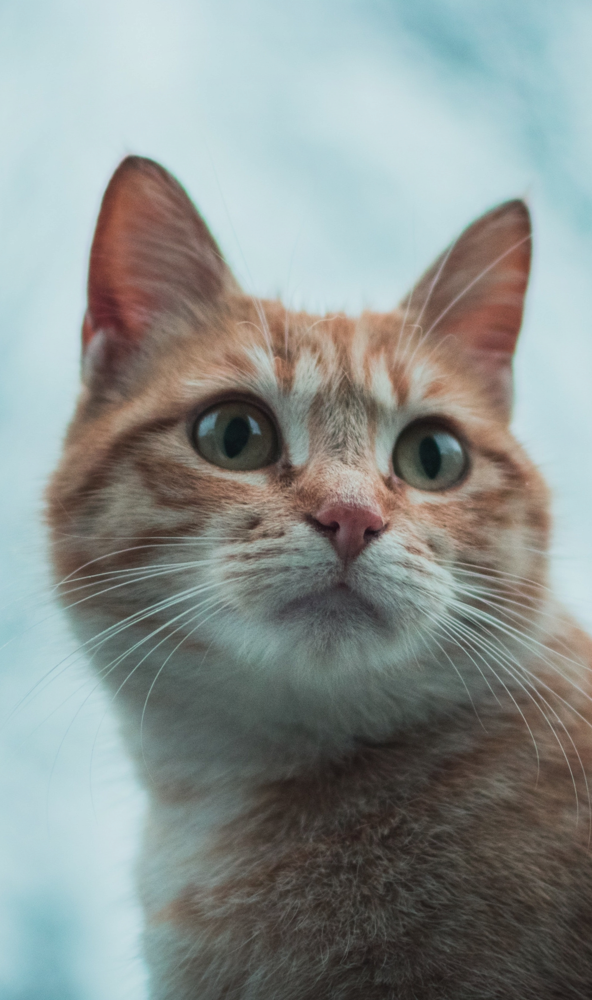

In [4]:
gatito

Para tener su representación en un array podemos utilizar el constructor `np.array` con argumento la imagen.

In [5]:
gatito_np = np.array(gatito)
print(f"Dimension de la imagen gatito: {gatito_np.shape}.\n")
print(f"Al convertir a np.ndarry el tipo de elementos es {gatito_np.dtype}.\n")
print(gatito_np[:, :, 0])

Dimension de la imagen gatito: (2160, 1280, 3).

Al convertir a np.ndarry el tipo de elementos es uint8.

[[179 179 179 ... 171 171 169]
 [181 181 181 ... 173 173 171]
 [179 179 181 ... 173 173 173]
 ...
 [125 123 129 ...  41  43  45]
 [127 125 127 ...  43  43  45]
 [125 123 123 ...  49  45  43]]


### 1.- Encontrando la imagen oculta

La imagen anterior tiene una imagen oculta, el ejercicio corresponde en descifrarlo. Las instrucciones son las siguientes:

1.1 Crear una lista vacía declarada como `secret_list`.

In [6]:
secret_list =[] ## FIX ME ##

1.2 Iterar por cada uno de los canales RGB (`gatito_np.shape[2]`) y en cada iteración:
 * Crear un arreglo temporal llamado `secret_aux` de dos dimensiones, de la misma dimension de pixeles de la imagen `gatito` y que tenga valores enteros, `0` si el valor de la capa de `gatito_np` es par y `1` si es impar. 
  - No iterar por filas y columnas.
  - Utilizar la operación módulo `%`. 
  - En la i-ésima iteración de los canales la capa de `gatito_np` es `gatito_np[:, :, i]`.
        
        
 * Escalar `secret_aux` a valores 0 y 255.
    
 * Cambiar el `dtype` de `secret_aux` a `np.uint8` (utilize el méteodo `astype()`).
            
 * Agregue `secret_aux` a `secret_list`.
    
Al final de la iteración `secret_list` debe tener solo tres arreglos.

**Observación:** recuerde que puede aplicar operaciones directo a un arreglo de numpy.

In [7]:
for channel in range(gatito_np.shape[2]):
    secret_aux = (gatito_np[:, :, channel])%2   #0 s
    secret_aux = secret_aux*255 ## FIX ME ##
    secret_aux = secret_aux.astype(np.uint8) ## FIX ME ##
    secret_list.append(secret_aux)

In [8]:
print(f"secret_list tiene {len(secret_list)} elementos")

secret_list tiene 3 elementos


In [9]:
secret_list[2].shape

(2160, 1280)

1.3 Crear la variable `secret_np` concatenando horizontalmente los elementos de `secret_list`.

In [10]:
#pip install opencv-python

In [11]:
#import cv2
frames=[secret_list[0],secret_list[1],secret_list[2]]
secret_np =np.concatenate(frames,axis=1)#cv2.hconcat(frames) ## FIX ME ##
secret_np.shape




(2160, 3840)

1.4 Crear el objeto `secret_img` utilizando el arreglo `secret_np`, asegurar que los valores estén entre 0 y 255, y que el dtype sea `np.uint8`, con el método `Image.fromarray` con argumento `mode="L"`

In [12]:
np.unique(secret_np)

array([  0, 255], dtype=uint8)

In [13]:
secret_np.dtype

dtype('uint8')

In [14]:
secret_img = Image.fromarray(secret_np,mode='L')

Ahora puedes ver el resultado!

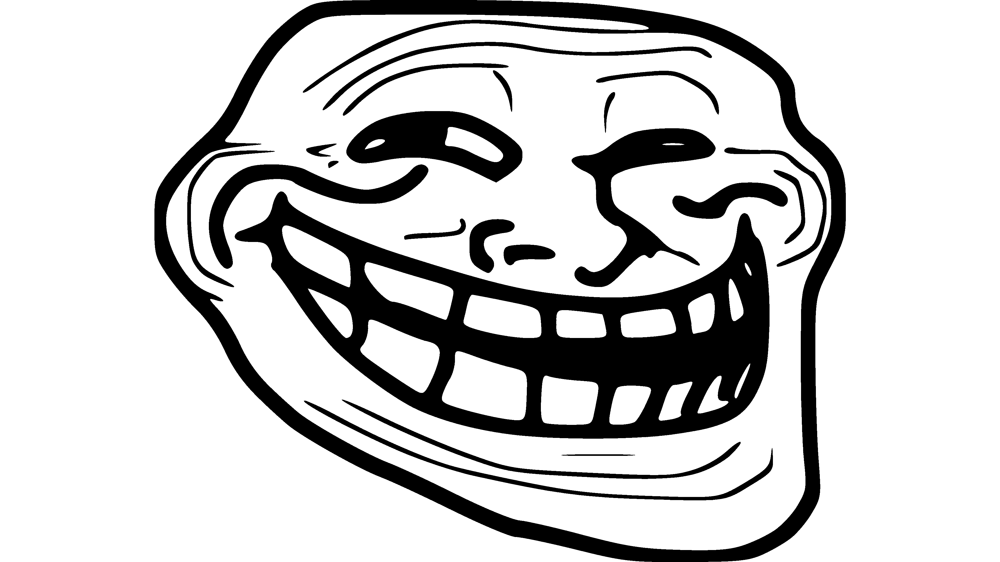

In [15]:
secret_img

### 2.- Escondiendo una nueva imagen

Es tu turno, ahora tu esconderás una imagen. Las instrucciones son las siguientes:

2.1 Selecciona una imagen de 2160 x 3840 pixeles (a.k.a resolución 4k), lo importante es que sea solo en blanco y negro, en la carpeta `images` se disponibiliza como ejemplo la imagen `black_and_white_example.jpg` y crea una variable llamada `my_img` leyendo la imagen seleccionada con `Image.open()`.

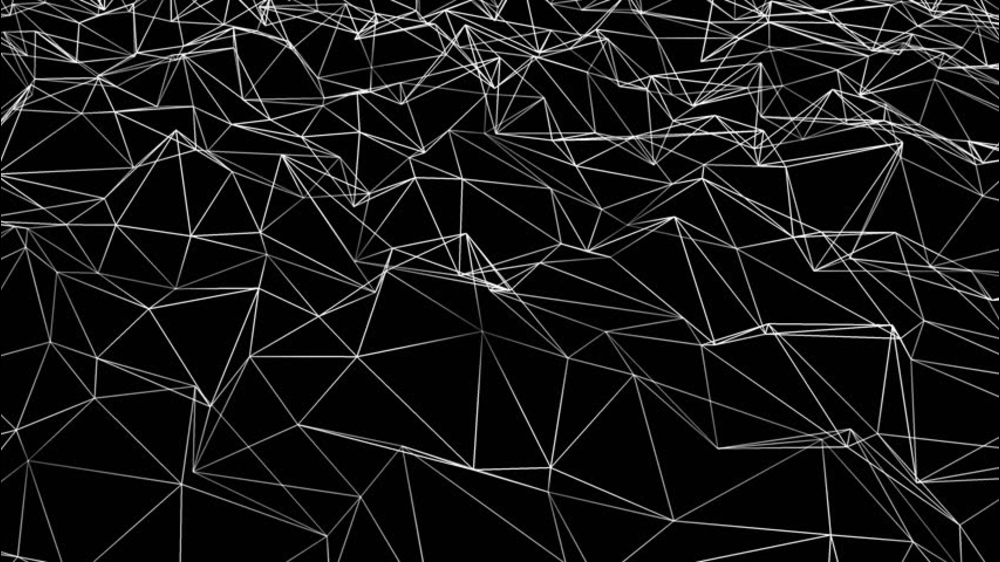

In [16]:
my_img = Image.open(os.path.join("images", "black_and_white_example.jpg"))
my_img

2.2 Crea un arreglo llamado `my_img_np` utilizando `my_img` y el método `np.array()`.
    * Es importante que `my_img_np.shape` sea `(2160, 3840)`, es decir, que solo sea de dos dimensiones. Esto porque es una imagen en blanco y negro, no necesitando el modelo RGB.

In [17]:
my_img_np =np.array(my_img)
print(my_img_np.shape)
my_img_np.dtype

(2160, 3840)


dtype('uint8')

2.3 Crear la variable `my_img_np_aux` utilizando un _umbral_ con tal de que:
    - 1: Si el valor del pixel es mayor  al _umbral_.
    - 0: Si el valor del pixel es menor o igual al _umbral_.
    - El `dtype` debe ser `np.uint8`.
    - Para `black_and_white_example.jpg` un umbral adecuado es `20`.

In [18]:
umbral = 20
my_img_np_aux =np.where(my_img_np > umbral,1,my_img_np*0)

In [19]:
my_img_np_aux

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [20]:
my_img_np_aux.shape

(2160, 3840)

Puedes probar que tan bien quedó la imagen con la siguiente linea. Si crees que no se ve bien, puedes cambiar el _umbral_.

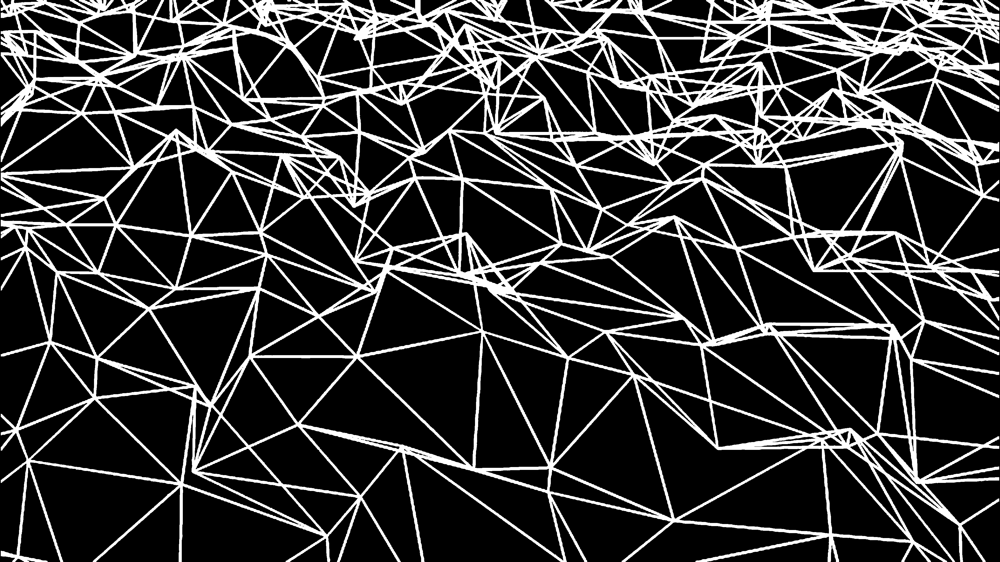

In [21]:
Image.fromarray(my_img_np_aux * 255)

2.4 Dividir la imagen en tres arreglos de tamaño (2160, 1280) y guardarlos en una lista con el nombre `my_img_split`. Hint: Revisa en la documentación de `numpy`.

In [22]:
my_img_split =[my_img_np_aux[:,0:1280],my_img_np_aux[:,1280:2560],my_img_np_aux[:,2560:3840]] ## FIX ME ##
my_img_split[0]

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

Revisa utilizando la siguiente iteración.

In [23]:
for img_array in my_img_split:
    print(img_array.shape)

(2160, 1280)
(2160, 1280)
(2160, 1280)


2.5 La imagen donde se esconderá tu imagen selecionada está en la carpeta `images` con el nombre `gatito_original.png`, que sospechosamente es de 2160 x 1280 pixeles. Carga la imagen en la variable `cat` y luego crea arreglo `cat_np` utilizando `cat`. Verifica que `cat_np.shape = (2160, 1280, 3)`.

In [24]:
cat = Image.open(os.path.join("images", "gatito.png"))
cat_np = np.array(cat)
print(cat_np.shape)

(2160, 1280, 3)


2.6 Convierte todos los valores de `cat_np` a valores pares. Esto lo puedes hacer sumando 1 a cada valor de arreglo si es impar

In [25]:
cat_np.shape

(2160, 1280, 3)

In [26]:
cat_np=np.where(cat_np%2==0,cat_np,cat_np+1)

In [27]:
cat_np

array([[[180, 212, 216],
        [180, 212, 216],
        [180, 210, 216],
        ...,
        [172, 202, 210],
        [172, 202, 210],
        [170, 200, 208]],

       [[182, 214, 218],
        [182, 214, 218],
        [182, 212, 218],
        ...,
        [174, 204, 212],
        [174, 204, 212],
        [172, 202, 210]],

       [[180, 212, 216],
        [180, 212, 216],
        [182, 212, 218],
        ...,
        [174, 204, 212],
        [174, 204, 212],
        [174, 204, 212]],

       ...,

       [[126, 180, 190],
        [124, 178, 188],
        [130, 184, 194],
        ...,
        [ 42,  36,  34],
        [ 44,  38,  36],
        [ 46,  40,  38]],

       [[128, 182, 192],
        [126, 180, 190],
        [128, 182, 192],
        ...,
        [ 44,  38,  38],
        [ 44,  38,  38],
        [ 46,  40,  38]],

       [[126, 180, 190],
        [124, 178, 188],
        [124, 178, 188],
        ...,
        [ 50,  44,  44],
        [ 46,  40,  38],
        [ 44,  38,  36]]

2.7 Itera por canal RGB de `cat_np` y en cada capa suma los valores de uno de los arreglos de `my_img_split`.

In [28]:
for channel in range(cat_np.shape[2]):
    cat_np[:, :, channel] += my_img_split[channel]

2.8 Crea una variable llamada `cat_secret_im` con `Image.fromarray` y la variable `cat_np` (que ya ha sido modificada). Luego guarda la imagen en la carpeta `images` con el nombre `my_secret.png`.

In [29]:
cat_secret_im = Image.fromarray(cat_np)
cat_secret_im.save(os.path.join("images", "my_secret.png"))#)

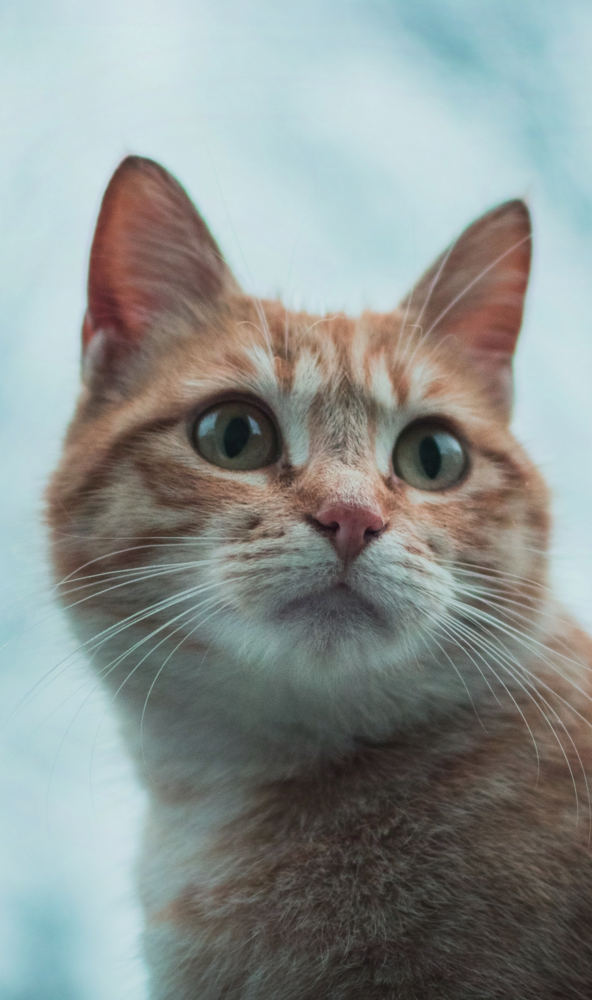

In [30]:
cat_secret_im

2.9 Crea una función llamada `imagenception()` que como argumento tenga la ruta de la imagen que quieres descifrar y que descifre la imagen secreta recientemente creada. Hint: Utiliza todos los pasos de la primera parte. 

In [31]:
def imagenception(filepath):
    gatito=Image.open(filepath)
    gatito_np = np.array(gatito)
    secret_list =[]
    for channel in range(gatito_np.shape[2]):
        secret_aux = (gatito_np[:, :, channel])%2   
        secret_aux = secret_aux*255 
        secret_aux = secret_aux.astype(np.uint8) 
        secret_list.append(secret_aux)
    #import cv2
    frames=[secret_list[0],secret_list[1],secret_list[2]]
    secret_np =np.concatenate(frames,axis=1)#cv2.hconcat(frames) ## FIX ME ##
    secret_img = Image.fromarray(secret_np,mode='L')
    return secret_img

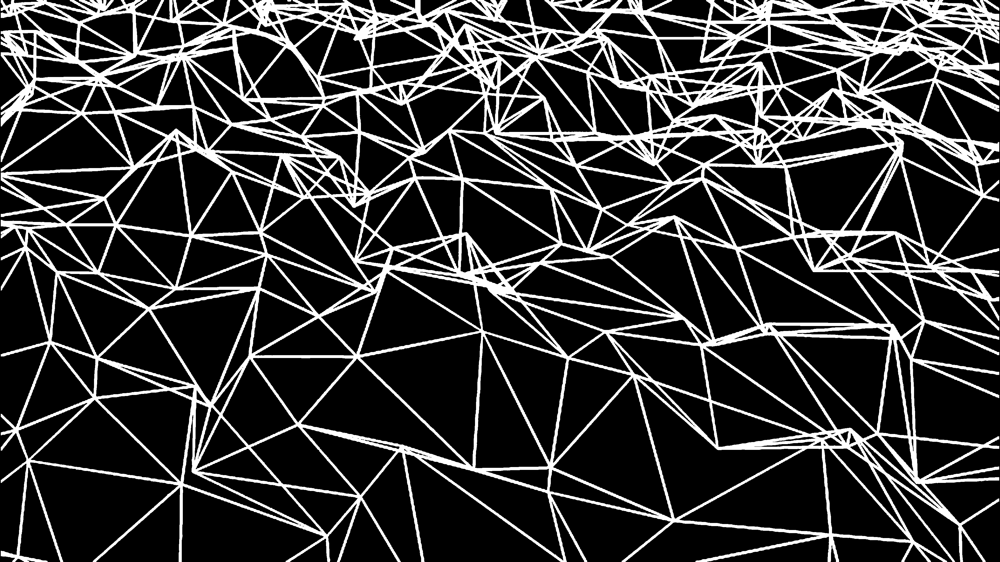

In [32]:
my_secret_img = imagenception(os.path.join("images", "my_secret.png"))
my_secret_img

## II.- Analizando la Felicidad

<img src="https://static01.nyt.com/images/2019/09/29/opinion/sunday/29HolsonStill/29HolsonStill-popup.jpg" width="480" height="360" align="center"/>

Este ejercicio es netamente análisis de datos, tratando de abarcar problemas típicos como la lectura de datos, corrección de errores, métricas agrupadas, unión de datos, etc. Utilizaremos un conjunto de datos llamado __World Happiness Report__ disponible en el siguiente [link](https://www.kaggle.com/unsdsn/world-happiness), de donde se puede obtener información al respecto.

#### Context
The World Happiness Report is a landmark survey of the state of global happiness. The first report was published in 2012, the second in 2013, the third in 2015, and the fourth in the 2016 Update. The World Happiness 2017, which ranks 155 countries by their happiness levels, was released at the United Nations at an event celebrating International Day of Happiness on March 20th. The report continues to gain global recognition as governments, organizations and civil society increasingly use happiness indicators to inform their policy-making decisions. Leading experts across fields – economics, psychology, survey analysis, national statistics, health, public policy and more – describe how measurements of well-being can be used effectively to assess the progress of nations. The reports review the state of happiness in the world today and show how the new science of happiness explains personal and national variations in happiness.

#### Content
The happiness scores and rankings use data from the Gallup World Poll. The scores are based on answers to the main life evaluation question asked in the poll. This question, known as the Cantril ladder, asks respondents to think of a ladder with the best possible life for them being a 10 and the worst possible life being a 0 and to rate their own current lives on that scale. The scores are from nationally representative samples for the years 2013-2016 and use the Gallup weights to make the estimates representative. The columns following the happiness score estimate the extent to which each of six factors – economic production, social support, life expectancy, freedom, absence of corruption, and generosity – contribute to making life evaluations higher in each country than they are in Dystopia, a hypothetical country that has values equal to the world’s lowest national averages for each of the six factors. They have no impact on the total score reported for each country, but they do explain why some countries rank higher than others.


### 2.1 Lectura de datos

In [33]:
# libraries
import os
import pandas as pd
import numpy as np
pd.set_option("display.max_columns", 999)  # Permite mostrar hasta 999 columnas de un DataFrame en Jupyter.

En la carpeta `data/world-happiness` se disponen de tres archivos, uno por cada reporte anual (años 2015, 2016 y 2017). No es de sorprender que envíen un archivo por año (podría ser mensual, semestral, etc.), lo imortante es ser capaces de leer una cantidad __variable__ de archivos al mismo tiempo. Una buena práctica es crear un diccionario de dataframes.

In [34]:
# Comprehension dictionary
df_dict = {
    year: pd.read_csv(os.path.join("data", "world-happiness", f"{year}.csv"))
    for year in [2015, 2016, 2017]
}

Por ejemplo, se puede acceder al DataFrame asociado al archivo `data/world-happiness/2016.csv` de la siguiente manera:

In [35]:
df_dict[2016].head()

,Country,Region,Happiness Rank,Happiness Score,Lower Confidence Interval,Upper Confidence Interval,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
0,Denmark,Western Europe,1,7.526,7.460,7.592,1.44178,1.16374,0.79504,0.57941,0.44453,0.36171,2.73939
1,Switzerland,Western Europe,2,7.509,7.428,7.590,1.52733,1.14524,0.86303,0.58557,0.41203,0.28083,2.69463
2,Iceland,Western Europe,3,7.501,7.333,7.669,1.42666,1.18326,0.86733,0.56624,0.14975,0.47678,2.83137
3,Norway,Western Europe,4,7.498,7.421,7.575,1.57744,1.12690,0.79579,0.59609,0.35776,0.37895,2.66465
4,Finland,Western Europe,5,7.413,7.351,7.475,1.40598,1.13464,0.81091,0.57104,0.41004,0.25492,2.82596


Una pequeña descripción de las columnas

* `Country` Name of the country.
* `Region` Region the country belongs to.
* `Happiness Rank` Rank of the country based on the Happiness Score.
* `Happiness Score` A metric measured in 2015 by asking the sampled people the question: "How would you rate your happiness on a scale of 0 to 10 where 10 is the happiest."
* `Standard Error` The standard error of the happiness score.
* `Economy (GDP per Capita)` The extent to which GDP contributes to the calculation of the Happiness Score.
* `Family` The extent to which Family contributes to the calculation of the Happiness Score
* `Health (Life Expectancy)` The extent to which Life expectancy contributed to the calculation of the Happiness Score
* `Freedom` The extent to which Freedom contributed to the calculation of the Happiness Score.
* `Trust (Government Corruption)` The extent to which Perception of Corruption contributes to Happiness Score.
* `Generosity` The extent to which Generosity contributed to the calculation of the Happiness Score.
* `Dystopia Residual` The extent to which Dystopia Residual contributed to the calculation of the Happiness Score.

Notar que los conjuntos de datos no poseen las mismas columnas, por lo tanto, solo se trabajarán con las columnas en común y posteriormente agregaremos el año con tal de concatenar los tres conjuntos.

In [36]:
from functools import reduce
intersection_columns = reduce(np.intersect1d, [df_i.columns.values for df_i in df_dict.values()]).tolist() + ["Year"]
print(intersection_columns)

['Country', 'Dystopia Residual', 'Economy (GDP per Capita)', 'Family', 'Freedom', 'Generosity', 'Happiness Rank', 'Happiness Score', 'Health (Life Expectancy)', 'Trust (Government Corruption)', 'Year']


Explica con tus palabras las operaciones que se realizaron para obtener la variable `intersection_columns`.

__Respuesta:__  < Reduce se utiliza para aplicar una función en su argumento a todos los elementos de la lista mencionados en en secuencia, es decir,aplicar la misma función al resultado obtenido anteriormente y el número que sigue al segundo elemento y el resultado se almacena nuevamente,este proceso continúa hasta que no quedan más elementos en el contenedor. En este  caso, la función empleada es "np.intersect1d" que encuentra la intersección de la secuencia de arrays (para 3 años) que posee los nombres de las columnas para cada año. Finalmente las nombres de las columnas en común son transformados a listas y adicionalmente se le agrega el nombre de  la columna año>


### 2.2 Concatenación y procesado

Define el DataFrame `happiness` tal que:

* Sea la concatenación de los dataframes de `df_dict`
    - Nota que en la documentación de `pd.concat` puedes entregar como argumento directamente un diccionario.
    - No ordenes los _axis_ (ver documentación).
    - Los nombres de los _levels_ para los multi-index resultante deben ser `["Year", "drop_me"]`.
* Aplica el método `drop_level` con tal de eliminar el nivel del multi-index llamado `drop_me`.
* Resetea los índices.
* Selecciona solo las columnas de la lista `intersection_columns`.
* Los nombres de las columnas deben estar en minísculas, reemplazar espacios por guiones bajos (`_`) y elimina los paréntesis.


In [37]:
happiness = (
    pd.concat(df_dict, axis=0,names=["Year", "drop_me"])              #agrego los nomnres para los levels de la concatenación
    .droplevel("drop_me")                                             #elimino el nivel "drop_me"
    .reset_index()                                                    #reseteo los indices
    .loc[:, intersection_columns]                                     #selecciono solamente las columnas de la lista intersection_columns
    .rename(columns=lambda x: x.lower().replace(" ", "_"))            #transformo a minusculas y remplazo espacio por "_"
)
happiness.head()

,country,dystopia_residual,economy_(gdp_per_capita),family,freedom,generosity,happiness_rank,happiness_score,health_(life_expectancy),trust_(government_corruption),year
0,Switzerland,2.51738,1.39651,1.34951,0.66557,0.29678,1,7.587,0.94143,0.41978,2015
1,Iceland,2.70201,1.30232,1.40223,0.62877,0.43630,2,7.561,0.94784,0.14145,2015
2,Denmark,2.49204,1.32548,1.36058,0.64938,0.34139,3,7.527,0.87464,0.48357,2015
3,Norway,2.46531,1.45900,1.33095,0.66973,0.34699,4,7.522,0.88521,0.36503,2015
4,Canada,2.45176,1.32629,1.32261,0.63297,0.45811,5,7.427,0.90563,0.32957,2015


### 2.3 Análisis

Como siempre, partimos con un análisis descriptivo simple.

In [38]:
happiness.describe(include="all").fillna("").T                           #Analisis descriptivo de las varaibles relleno nulos con ""

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
country,470,166,Kazakhstan,3,,,,,,,
dystopia_residual,470,,,,2.09272,0.565772,0.32858,1.73798,2.09464,2.45557,3.83772
economy_(gdp_per_capita),470,,,,0.92783,0.415584,0,0.605292,0.995439,1.25244,1.87077
family,470,,,,0.990347,0.318707,0,0.793,1.02567,1.22875,1.61057
freedom,470,,,,0.402828,0.150356,0,0.297615,0.418347,0.51685,0.66973
generosity,470,,,,0.242241,0.131543,0,0.152831,0.22314,0.315824,0.838075
happiness_rank,470,,,,78.8298,45.2814,1,40,79,118,158
happiness_score,470,,,,5.37073,1.137,2.693,4.509,5.2825,6.23375,7.587
health_(life_expectancy),470,,,,0.579968,0.240161,0,0.402301,0.630053,0.768298,1.02525
trust_(government_corruption),470,,,,0.13479,0.111313,0,0.0597774,0.0995017,0.173161,0.55191


¿Cuántos países no tienen mediciones de felicidad en los tres años del estudio? ¿Cuáles son?

In [39]:
grupo = happiness.groupby('country')        #Agrupo por pais.
a=grupo[['year']].count()                   #analizo cuantas mediciones hay en total para los 3 años.                    
mask=a['year']<3                            #mascara para seleccionar aquellos paises que tengan menos de 3 mediciones.
a[mask]                                     # Paises que no tienen mediciones en los 3 años de estudio.


,year
country,
Belize,2
Central African Republic,2
Comoros,2
Djibouti,1
Hong Kong,2
"Hong Kong S.A.R., China",1
Laos,2
Lesotho,2
Mozambique,2


__Respuesta:__  < 20 paises no considerando duplicados que son: Hong Kong, Taiwan y Somaliland Region. Si se eliminan serían un total de 15 paises, cuyo filtro se hace en la siguiente pregunta>

Note que la lista de países proveniente de la pregunta anterior tiene errores de consistencia, por ejemplo están los registros de `Hong Kong` y `Hong Kong S.A.R., China` que escencialmente son el mismo. Lo mismo ocurre con `Taiwan` y `Somaliland Region`.

Modifique la columna `country` del dataframe `happiness` con tal de reparar los errores de `Hong Kong`, `Taiwan` y `Somaliland Region`.

In [40]:
bad_country_names_dict = {"Hong Kong S.A.R., China": "Hong Kong", "Taiwan Province of China": "Taiwan","Somaliland region": "Somaliland Region"}

def usar_diccionario(diccionario,columna):
    
    """
    usar_diccionario(diccionario,columna)

    Remplazar elementos de una serie mediante datos de un diccionario dado.

    Parametros
    ----------
    diccionario : diccionario

    columna : serie

    Resultado
    -------
    columna : Serie
        columna inicial modificada por los valores del diccionario.

    
    Examples
    --------
    >>> x1 = ['arbol','casa','zapato','flor']
    >>> x1
    ['arbol','casa','zapato','flor']
    >>> diccionario={'arbol':'arbolito','casa':'casita','zapato':'zapatito','flor':'florcita'}
    {'arbol':'arbolito','casa':'casita','zapato':'zapatito','flor':'florcita'}
    'aplicando la función
    >>> ['arbolito','casita','zapatito','florcita']       
    """
    for j in range(len(columna)):
        if columna[j] in diccionario.keys():
            columna[j]=diccionario[columna[j]]
        
    return columna
    

In [41]:
#en este caso aplico la funcion más arriba para modicar los nombres de las columnas con problemas

happiness = happiness.assign(country= lambda x: usar_diccionario(bad_country_names_dict,x['country']))

#Agrupo por paises nuevamente y cuento cuantas mediciones existen en los 3 años.

grupo1 = happiness.groupby('country')
a1=grupo1[['year']].count()

#identifico cual pais tiene menos de 3 mediciones, creo máscara y filtro

mask1=a1['year']<3
a1[mask1]

,year
country,
Belize,2
Central African Republic,2
Comoros,2
Djibouti,1
Laos,2
Lesotho,2
Mozambique,2
Namibia,2
Oman,1


Luego de la modificación, ¿Cuántos países no tienen mediciones en los tres años de estudio?

__Respuesta:__  < 15 paises indicados en la tabla anterior: Belize,Central African Republic,Comoros  ,Djibouti, Laos,Lesotho,Mozambique,Namibia,Oman, Puerto Rico,Somalia,Somaliland Region, South Sudan, Suriname, Swaziland>

Pivotea el dataframe `happines` tal que los índices sean los años, las columnas los países y el valor su `happiness_score`. LLena los valores nulos con un _string_ vacío `""`. Un país no puede tener más de un registro por año, por lo que puedes utilizar directamente el médoto `pd.DataFrame.pivot()`.


In [42]:
# formato wide

happiness_pivoteada=happiness.pivot_table(index="year", columns="country", values="happiness_score", fill_value="", aggfunc=pd.np.max)
happiness_pivoteada

country,Afghanistan,Albania,Algeria,Angola,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahrain,Bangladesh,Belarus,Belgium,Belize,Benin,Bhutan,Bolivia,Bosnia and Herzegovina,Botswana,Brazil,Bulgaria,Burkina Faso,Burundi,Cambodia,Cameroon,Canada,Central African Republic,Chad,Chile,China,Colombia,Comoros,Congo (Brazzaville),Congo (Kinshasa),Costa Rica,Croatia,Cyprus,Czech Republic,Denmark,Djibouti,Dominican Republic,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Finland,France,Gabon,Georgia,Germany,Ghana,Greece,Guatemala,Guinea,Haiti,Honduras,Hong Kong,Hungary,Iceland,India,Indonesia,Iran,Iraq,Ireland,Israel,Italy,Ivory Coast,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kosovo,Kuwait,Kyrgyzstan,Laos,Latvia,Lebanon,Lesotho,Liberia,Libya,Lithuania,Luxembourg,Macedonia,Madagascar,Malawi,Malaysia,Mali,Malta,Mauritania,Mauritius,Mexico,Moldova,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Netherlands,New Zealand,Nicaragua,Niger,Nigeria,North Cyprus,Norway,Oman,Pakistan,Palestinian Territories,Panama,Paraguay,Peru,Philippines,Poland,Portugal,Puerto Rico,Qatar,Romania,Russia,Rwanda,Saudi Arabia,Senegal,Serbia,Sierra Leone,Singapore,Slovakia,Slovenia,Somalia,Somaliland Region,South Africa,South Korea,South Sudan,Spain,Sri Lanka,Sudan,Suriname,Swaziland,Sweden,Switzerland,Syria,Taiwan,Tajikistan,Tanzania,Thailand,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,Uganda,Ukraine,United Arab Emirates,United Kingdom,United States,Uruguay,Uzbekistan,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015,3.575,4.959,5.605,4.033,6.574,4.350,7.284,7.200,5.212,5.960,4.694,5.813,6.937,,3.340,5.253,5.890,4.949,4.332,6.983,4.218,3.587,2.905,3.819,4.252,7.427,3.678,3.667,6.670,5.140,6.477,3.956,3.989,4.517,7.226,5.759,5.689,6.505,7.527,4.369,4.885,5.975,4.194,6.130,5.429,4.512,7.406,6.575,3.896,4.297,6.750,4.633,4.857,6.123,3.656,4.518,4.788,5.474,4.800,7.561,4.565,5.399,4.686,4.677,6.940,7.278,5.948,3.655,5.709,5.987,5.192,5.855,4.419,5.589,6.295,5.286,4.876,5.098,4.839,4.898,4.571,5.754,5.833,6.946,5.007,3.681,4.292,5.770,3.995,6.302,4.436,5.477,7.187,5.889,4.874,5.192,5.013,4.971,4.307,,4.514,7.378,7.286,5.828,3.845,5.268,5.695,7.522,6.853,5.194,4.715,6.786,5.878,5.824,5.073,5.791,5.102,,6.611,5.124,5.716,3.465,6.411,3.904,5.123,4.507,6.798,5.995,5.848,,5.057,4.642,5.984,,6.329,4.271,4.550,6.269,4.867,7.364,7.587,3.006,6.298,4.786,3.781,6.455,2.839,6.168,4.739,5.332,5.548,3.931,4.681,6.901,6.867,7.119,6.485,6.003,6.810,5.360,4.077,5.129,4.610
2016,3.360,4.655,6.355,3.866,6.650,4.360,7.313,7.119,5.291,6.218,4.643,5.802,6.929,5.956,3.484,5.196,5.822,5.163,3.974,6.952,4.217,3.739,2.905,3.907,4.513,7.404,,3.763,6.705,5.245,6.481,3.956,4.236,4.272,7.087,5.488,5.546,6.596,7.526,,5.155,5.976,4.362,6.068,5.517,4.508,7.413,6.478,4.121,4.252,6.994,4.276,5.033,6.324,3.607,4.028,4.871,5.458,5.145,7.501,4.404,5.314,4.813,4.575,6.907,7.267,5.977,3.916,5.510,5.921,5.303,5.919,4.356,5.401,6.239,5.185,4.876,5.560,5.129,,3.622,5.615,5.813,6.871,5.121,3.695,4.156,6.005,4.073,6.488,4.201,5.648,6.778,5.897,4.907,5.161,5.151,,4.395,4.574,4.793,7.339,7.334,5.992,3.856,4.875,5.771,7.498,,5.132,4.754,6.701,5.538,5.743,5.279,5.835,5.123,7.039,6.375,5.528,5.856,3.515,6.379,4.219,5.177,4.635,6.739,6.078,5.768,5.44,5.057,4.459,5.835,3.832,6.361,4.415,4.139,6.269,,7.291,7.509,3.069,6.379,4.996,3.666,6.474,3.303,6.168,5.045,5.389,5.658,3.739,4.324,6.573,6.725,7.104,6.545,5.987,6.084,5.061,3.724,4.795,4.193
2017,3.794,4.644,5.872,3.795,6.599,4.376,7.284,7.006,5.234,6.087,4.608,5.569,6.891,5.956,3.657,5.011,5.823,5.182,3.766,6.635,4.714,4.032,2.905,4.168,4.695,7.316,2.693,3.936,6.652,5.273,6.357,,4.291,4.280,7.079,5.293,5.621,6.609,7.522,,5.230,6.008,4.735,6.003,5.611,4.460,7.469,6.442,4.465,4.286,6.951,4.120,5.227,6.454,3.507,3.603,5.181,5.472,5.324,7.504,4.315,5.262,4.692,4.497,6.977,7.213,5.964,4.180,5.311,5.920,

¿Qué información podrías sacar rápidamente de esta tabla pivoteada? ¿Podrías decir que siempre es útil pivotear una tabla?

__Respuesta:__  < Se puede extraer la evolución de happiness_score de 3 años para los paises estudiados. Claramente por sus dimensiones, cantidad de columnas, es dificil realizar  un análisis de los datos de manera general, a partir de la tabla,  lo cual es una desventaja ante gran cantidad de datos.En su lugar preferiria graficar>

En promedio, ¿Cuáles son los tres países con el mejor ranking de felicidad?

In [43]:
#hago una agrupación por países

grupo1 = happiness.groupby('country')

#calculo el promedio de ranking de felicidad de todos los paises en los 3 años y
#luego ordeno de mayor a menos seleccionando los 3 con mejor ranking de felicidad promedio.

mejor_ranking=grupo1[['happiness_rank']].mean().sort_values(by=['happiness_rank'],ascending=True)
mejor_ranking[0:3]

,happiness_rank
country,
Denmark,2.000000
Switzerland,2.333333
Iceland,2.666667


__Respuesta:__  < Denmark, Switzerland y Iceland. Ver Tabla anterior >

En promedio, ¿Cuáles son los tres países con el mayor _score_ de felicidad? ¿Son distintos a los con mejor ranking en promedio?

In [44]:
#selecciono la columna con happiness_score y calculo el promedio por pais
#(grupo1 corresponde a un groupby por pais)

#luego ordeno los valores de mayor a menor escogiendo los 3 valores con mayor happiness_score.


mejor_score=grupo1[['happiness_score']].mean().sort_values(by=['happiness_score'],ascending=False)
mejor_score[0:3]

,happiness_score
country,
Switzerland,7.530
Denmark,7.525
Iceland,7.522


__Respuesta:__  < Switzerland, Denmark, Iceland. Son los mismos paises pero en ordenes diferentes.>

Calcula el promedio anual de todas las columnas factores de felicidad, es decir, todas las variables numéricas excepto `happiness_score` y `happiness_rank`.

In [45]:
data=happiness.drop(['happiness_score','happiness_rank','country'],axis=1)#Retiro del analisis columnas happiness_score y happiness_rank
grupo2 = data.groupby(['year'])                 #agrupo por año

hap_mean_factors=grupo2.mean()                  #promedio anual de todas las columnas factores de felicidad
hap_mean_factors

,dystopia_residual,economy_(gdp_per_capita),family,freedom,generosity,health_(life_expectancy),trust_(government_corruption)
year,,,,,,,
2015,2.098977,0.846137,0.991046,0.428615,0.237296,0.630259,0.143422
2016,2.325807,0.953880,0.793621,0.370994,0.242635,0.557619,0.137624
2017,1.850238,0.984718,1.188898,0.408786,0.246883,0.551341,0.123120


Respecto al cálculo anterior, para cada uno de los años, ¿Cuál es el factor que más contribuye (en promedio) al _score_ de la felicidad y en qué medida?

__Resuesta:__
* 2015:  < dystopia_residual, >
* 2016:  < dystopia_residual >
* 2017:  < family >

### 2.4 Agregando más datos

A continuación, agregaremos un nuevo conjunto de datos, el que contiene estadísticas de suicidio por años, países y rangos etáreos. Se encuentra disponible en el siguiente [link](https://www.kaggle.com/russellyates88/suicide-rates-overview-1985-to-2016).

In [46]:
suicide = pd.read_csv(os.path.join("data", "suicide_rates.csv"))
suicide.head()

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year ($),gdp_per_capita ($),generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,156,624,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,"2,156,624,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,"2,156,624,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,"2,156,624,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,"2,156,624,900",796,Boomers


La mayoría de las columnas son autoexplicativas.
* `country`
* `year`
* `sex`
* `age`
* `suicides_no`
* `population`
* `suicides/100k pop`
* `country-year`
* `HDI for year` Human Development Index
* `gdp_for_year ($)` Gross Domestic Product
* `gdp_per_capita ($)`
* `generation` based on age grouping average

Un poco de estadística descriptiva.

In [47]:
suicide.describe(include="all").fillna("").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
country,27820,101,Netherlands,382,,,,,,,
year,27820,,,,2001.26,8.46906,1985,1995,2002,2008,2016
sex,27820,2,female,13910,,,,,,,
age,27820,6,25-34 years,4642,,,,,,,
suicides_no,27820,,,,242.574,902.048,0,3,25,131,22338
population,27820,,,,1.84479e+06,3.91178e+06,278,97498.5,430150,1.48614e+06,4.38052e+07
suicides/100k pop,27820,,,,12.8161,18.9615,0,0.92,5.99,16.62,224.97
country-year,27820,2321,Barbados2005,12,,,,,,,
HDI for year,8364,,,,0.776601,0.0933667,0.483,0.713,0.779,0.855,0.944
gdp_for_year ($),27820,2321,"15,846,474,596",12,,,,,,,


Crea un nuevo DataFrame llamado suicide_agg siguiendo las siguientes instrucciones:

* Agrupa por país y año.
* Suma la población y el número de suicidios.
* Resetea los índices.
* Agrega una nueva columna llamada `suicides_ratio_100k` formada por la división de `suicides_no` y `population`, para posteriormente muliplicarla por 100,000.
* Agrega una nuevale columna llamada `suicides_rank` similar a `happiness_rank`, es decir, que asigne un orden __por año__ a cada país según la columna `suicides_ratio_100k` tal que el rank 1 corresponda al que tenga mayor `suicides_ratio_100k`. Hint: Usa el método `rank()`.

In [48]:
suicides_agg = (
    suicide.groupby(['country','year'])           #Agrupa por país y año
    .agg({'population' : 'sum',                   #Suma la población y el número de suicidios
         'suicides_no':'sum'}
    )
    .reset_index()                                #Resetea los índices
    .assign(
        suicides_ratio_100k=lambda x: x.suicides_no/x.population*100000, #Agrega varible suicide_ratio_100k
        suicides_rank=lambda x: x.groupby('year').suicides_ratio_100k.rank(ascending=False) #se selecciona este método arbitrariamente
    )                                             
)


Crea un nuevo DataFrame con el nombre `hap_sui` al unir `happiness` y `suicides_agg` tal que coincidan país y año, quédate con solo los registros que coincidan en ambas DataFrames.

In [49]:
hap_sui =pd.merge(happiness, suicides_agg, how='inner', on=['country', 'year'])
#mask=hap_sui['year']==2015
#dos=hap_sui[mask]
hap_sui

,country,dystopia_residual,economy_(gdp_per_capita),family,freedom,generosity,happiness_rank,happiness_score,health_(life_expectancy),trust_(government_corruption),year,population,suicides_no,suicides_ratio_100k,suicides_rank
0,Switzerland,2.51738,1.39651,1.34951,0.66557,0.29678,1,7.587,0.94143,0.41978,2015,7892502,1073,13.595182,22.0
1,Iceland,2.70201,1.30232,1.40223,0.62877,0.43630,2,7.561,0.94784,0.14145,2015,308554,40,12.963695,24.0
2,Denmark,2.49204,1.32548,1.36058,0.64938,0.34139,3,7.527,0.87464,0.48357,2015,5383060,564,10.477312,31.0
3,Norway,2.46531,1.45900,1.33095,0.66973,0.34699,4,7.522,0.88521,0.36503,2015,4882909,590,12.082961,26.0
4,Finland,2.61955,1.29025,1.31826,0.64169,0.23351,6,7.406,0.88911,0.41372,2015,5181797,731,14.107075,18.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63,Romania,2.45184,1.16970,0.72803,0.36712,0.12889,71,5.528,0.67602,0.00679,2016,16644905,1953,11.733320,10.0
64,Croatia,2.52462,1.18649,0.60809,0.23907,0.18434,74,5.488,0.70524,0.04002,2016,3567043,683,19.147512,4.0
65,Hungary,1.95473,1.24142,0.93164,0.19770,0.09900,91,5.145,0.67608,0.04472,2016,8390370,1761,20.988347,2.0
66,Mongolia,1.53586,0.98853,1.08983,0.35972,0.34539,101,4.907,0.55469,0.03285,2016,2167589,423,19.514770,3.0


¿Qué tipo de correlación lineal hay entre las variables `happiness_rank` y `suicides_rank`?

In [50]:
hap_sui.loc[:,["happiness_rank", "suicides_rank"]].corr(method='pearson').head(100)#method='spearman'

,happiness_rank,suicides_rank
happiness_rank,1.000000,0.038896
suicides_rank,0.038896,1.000000


__Respuesta:__  < No existe correlación entre las variables, acercandose a cero. Se puede ver mediante el gráfico además >

Text(0, 0.5, 'suicides_rank')

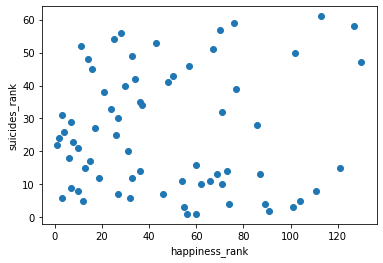

In [51]:
plt.scatter(hap_sui.loc[:,["happiness_rank"]],hap_sui.loc[:,["suicides_rank"]])
plt.xlabel('happiness_rank')
plt.ylabel('suicides_rank')

¿Qué tipo de correlación lineal hay entre las variables `happiness_rank` y `suicides_rank` por cada año?

In [52]:
hap_sui2=hap_sui.groupby(['year'])
hap_sui2[ ["happiness_rank", "suicides_rank"]].corr()#method='spearman')

happiness_rank  suicides_rank
year                                              
2015 happiness_rank        1.000000       0.101215
     suicides_rank         0.101215       1.000000
2016 happiness_rank        1.000000       0.022048
     suicides_rank         0.022048       1.000000

__Respuesta:__  < No hay correlación entre las variables >

¿La respuesta de las dos preguntas anteriores cambia si se utilizan las variables `happiness_score` y `suicides_ratio_100k`?

No cambian.

In [53]:
hap_sui.loc[:,["happiness_rank", "suicides_ratio_100k"]].corr(method='spearman').head(100)

,happiness_rank,suicides_ratio_100k
happiness_rank,1.000000,-0.059916
suicides_ratio_100k,-0.059916,1.000000


In [54]:
hap_sui2=hap_sui.groupby(['year'])
hap_sui2[ ["happiness_rank", "suicides_ratio_100k"]].corr(method='spearman')

happiness_rank  suicides_ratio_100k
year                                                         
2015 happiness_rank             1.000000            -0.073617
     suicides_ratio_100k       -0.073617             1.000000
2016 happiness_rank             1.000000            -0.003571
     suicides_ratio_100k       -0.003571             1.000000

### III.- Índices de Costos de Vida

<img src="https://i.pinimg.com/originals/e7/dd/38/e7dd3861c4d30a2826515a8861300db7.png" width="480" height="360" align="center"/>

Estos índices están ajustados a la Ciudad de Nueva York (NYC). Lo que significa que para la Ciudad de Nueva York, cada índice debería marcar 100(%). Si otra ciudad tiene, por ejemplo, un índice de alquiler de 120, significa que en esa ciudad se paga de media por el alquiler un 20% más que en Nueva York. Si una ciudad tiene un índice de alquiler de 70, significa que en esa ciudad los alquileres son de media un 30% más baratos que en Nueva York.

* El Índice de Costo de Vida (Sin Alquiler) es un indicador relativo de los precios de bienes de consumo, incluyendo comestibles, restaurantes, transporte y servicios. El Índice de Costo de Vida no incluye gastos de residencia como alquileres o hipotecas. Si una ciudad tiene un Costo de Vida de 120, significa que Numbeo estima que es un 20% más cara que Nueva York (sin contar alquiler).

* El Índice de Alquiler es una estimación de precios de alquiler de apartamentos de una ciudad comparada con Nueva York. Si el Índice de Alquiler es 80, Numbeo estima que el precio de los alquileres en esa ciudad es de media un 20% más barato que en Nueva York.

* El Índice de Comestibles es una estimación de los precios de la compra de una ciudad en comparación con Nueva York. Para calcular esta sección, Numbeo utiliza el peso de los artículos en la sección "Mercados" por cada ciudad.

* El Índice de Restaurantes es una comparación de precios de comidas y bebidas en bares y restaurantes en comparación con NY.

* El Índice de Costo de Vida más Alquiler es una estimación de precios de consumo incluyendo alquiler en comparación con la Ciudad de Nueva York.

* El Poder Adquisitivo Local muestra la capacidad adquisitiva relativa a la hora de comprar bienes y servicios en una ciudad determinada, con relación al salario medio de la ciudad. Si el poder adquisitivo doméstico es 40, significa que los habitantes de dicha ciudad con salario medio pueden permitirse comprar una media de 60% menos bienes y servicios que los habitantes de Nueva York con salario medio. 

Para más información sobre los pesos utilizados (fórmula completa) puedes visitar: [motivación y metodología](https://es.numbeo.com/coste-de-vida/motivaci%C3%B3n-y-metodolog%C3%ADa).

Para comenzar es necesario instalar el paquete `lxml` en tu entorno virtual de conda para poder descargar los datos. Basta con ejecutar 

`conda install -n mat281 lxml`

O cambia `mat281` por el ambiente que estés utilizando.

Se disponibiliza a continuación la carga de datos de un dataframe.

In [55]:
pip install lxml

In [56]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', 999)
%matplotlib inline

In [58]:
years = [2015, 2016, 2017, 2018, 2019, 2020]
life_cost = (
    pd.concat(
        {
            year: (
                pd.read_html(f"https://www.numbeo.com/cost-of-living/rankings.jsp?title={year}")[1]
                .rename(columns=lambda x: x.lower().replace(" ", "_"))
                .assign(rank=lambda x: x.index + 1)
                .set_index("rank")
            ) for year in years
        }
    )
    .rename_axis(["year", "rank"])
    .reset_index()
)
life_cost.head()

,year,rank,city,cost_of_living_index,rent_index,cost_of_living_plus_rent_index,groceries_index,restaurant_price_index,local_purchasing_power_index
0,2015,1,"Hamilton, Bermuda",163.55,120.02,142.28,191.71,132.91,69.79
1,2015,2,"Geneva, Switzerland",145.18,81.46,114.05,161.14,141.23,130.21
2,2015,3,"Caracas, Venezuela",141.41,60.46,101.86,155.16,122.27,9.73
3,2015,4,"Zurich, Switzerland",141.06,66.39,104.57,148.56,146.90,133.91
4,2015,5,"Tromso, Norway",131.45,55.80,94.48,127.72,137.08,132.41


### Ejercicio 3.1 

* Sea la concatenación de los dataframes en formato diccionario asociado al año extraido de la página indicada.
* Agrega una columna rank a partir de los indices de los dataframes +1.
* establece el indice del dataframe a partir de la columna rank.
* Los nombres de las columnas deben estar en minísculas, reemplazar espacios por guiones bajos (_)
* Los nombres de los levels para los multi-index resultante deben ser ["Year", "rank"].
* Resetea los índices.
* mostrar tabla.


### Ejercicio 3.2 

Genera un histograma del índice del costo de vida (sin alquiler) para cada año (es decir, 6 histogramas).

¿Qué conclusión puedes sacar de estos gráficos?

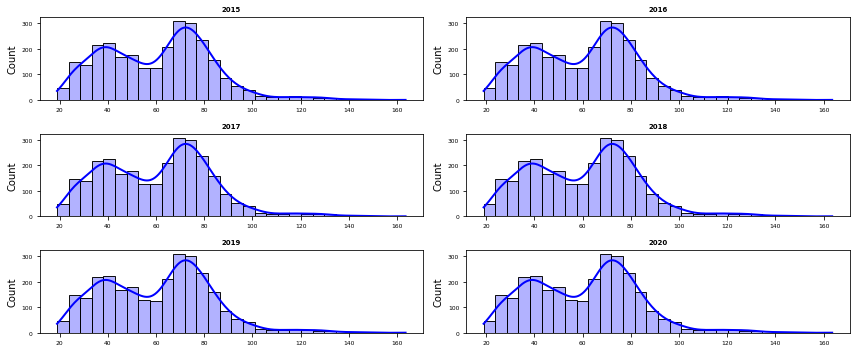

In [59]:
## import seaborn as sns 

import seaborn as sns
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 5))   
axes = axes.flat

for i in range(len(years)):      
    sns.histplot(
        data    = life_cost,
        x       = 'cost_of_living_index',
        stat    = "count",
        kde     = True,
        color   = 'blue',
        line_kws= {'linewidth': 2},
        alpha   = 0.3,
        ax      = axes[i]
    )
    axes[i].set_title(years[i], fontsize = 7, fontweight = "bold")
    axes[i].tick_params(labelsize = 6)
    axes[i].set_xlabel("")
    
    
fig.tight_layout() ##




### Respuesta
* En general se observa que la mayoria de los paises poseen un indice del costo de vida menor que la ciudad de New York, principalmente entorno a un 40% y 75% del valor del indice del costo de vida New york. En terminos coloquiales,sería más económicos los costos de vida en otras ciudades.

### Ejercicio 3.3 

Grafica el índice de restaurantes a través de los años para diez ciudades escogidas pseudo-aleatoriamente (variable `my_cities` de la celda siguiente) en un mismo gráfico. Recuerda escoger el tipo de gráfico adecuadamente.

¿Ves alguna relación? ¿Qué podrías decir del gráfico? ¿Por qué no graficar todas las ciudades en lugar de solo escoger algunas?

In [ ]:
rol_seed = 201204515  # Escribe tu rol UTFSM sin número verificador
my_cities = life_cost["city"].drop_duplicates().sample(n=10, random_state=rol_seed).values

my_cities

In [ ]:
life_cost.columns

In [ ]:
## FIX ME PLEASE ##
fig,ax=plt.subplots(figsize=(9, 5))

mianalisis=life_cost['city'].isin(my_cities)
datos=life_cost[mianalisis]
sns.lineplot(
    x='year',
    y='restaurant_price_index',
    hue='city',# color por Generation
    data=datos,
    ci = None
)

ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.xlabel('year') # nombre eje x
plt.ylabel('restaurant_price_index') # nombre eje y
plt.show()


_## TU RESPUESTA AQUÍ ##_

* ¿Ves alguna relación? R: En general se observan 2 grandes grupos de diferente rango de variación del indice de precio de restaurantes.Por otro lado se observa que el 2018 la mayoria de lass ciudades analizadas presento un incremento en el indicador de precio de restaurante. Sin embargo, no hay una tendencia clara acerca si el indicador va aumentar o decaer en los proximos años. 


* ¿Qué podrías decir del gráfico? R: En general las ciudades analizadas de United States, Italia y Emerates Arabes, presentan un indicador de indice precio restaurante,en general entorno en el rango de 70 y 80%. Sin embargo, ciudades de Phillippines , Poland y méxico pueden agruparse en otro grupo que varía entre el 40y 20% del indice.

* ¿Por qué no graficar todas las ciudades en lugar de solo escoger algunas? R: Por que se produce una saturación visual ante la gran cantidad de ciudades a analizar. Una estrategia sería separar por paises, pensando que las ciudades presentan cierta similitu, separar por continentes pensando que le panorama regional de los paises no varia tanto.

### Ejercicio 3.4

Genera un mapa de calor tal que:

- El eje horizontal corresponda a cada uno de los índices.
- El eje vertical corresponda a cada una de las ciudades de `my_cities`.
- El color y valor en cada celda sea el promedio de los indicadores.
    - El valor de la celda debe tener solo dos decimales.

In [ ]:
redable_index_names = {
    'cost_of_living_index': 'Costo de Vida',
    'rent_index': 'Alquiler',
    'cost_of_living_plus_rent_index': 'Costo de Vida + Alquiler',
    'groceries_index': 'Comestibles',
    'restaurant_price_index': 'Restaurantes',
    'local_purchasing_power_index': 'Poder Adquisitivo Local'
}

In [ ]:
## FIX ME PLEASE ##

datos_p=datos.groupby(['city'])   #Agrupamiento por pais
lista_promedios=datos_p.mean().drop(['year','rank'],axis=1).reset_index() #calcular por valores  promedios para cada indice 
                                                                        #resetear indices

lista_promedios.head(10)

In [ ]:
lista_promedios = lista_promedios.rename(columns=redable_index_names)  #renombrar columnas a partir de nombres recomendados
lista_promedios

In [ ]:

fig,ax=plt.subplots(figsize=(10, 8))

df1 = lista_promedios.melt(id_vars="city", var_name="Index")
fl = df1.pivot("city", "Index", "value")
ax = sns.heatmap(fl,annot=True,fmt=".2f",cmap='Greens',linewidths=.5)

plt.show()



* Dentro de las variables analizadas el poder adquisitivo local de las ciudades analizadas de una parte importante de los paises analizados fue el unico indicador en que se supero a la ciudad de New York. Sin embargo,en general se observo que los otros indicadores fueron menores, es decir los alquileres, combustibles, costo de vida, restaurantes son más económicos respecto a new york.

* Por otro lado, está economia en los costos de vida en algunas ciudades del analisis de EEUU respecto a New York, pudiese implicar la mayor capacidad de adquisición respecto nueva york, que se ve reflejado en el mapa.

* Otras ciudades como Davao Philippines donde  los costos son menores tambien se asocia a un poder adquisitivo bajo, probablemente a los bajos recursos de la Región.

### Ejercicio 3.5

Primero, agregar la columna `country` al dataframe `life_cost` a partir de la columna `city`. Luego, realizar un scatter plot donde:

- Datos correspondientes al año 2020.
- El eje horizontal corresponda a el Índice de Comestibles.
- El eje vertical corresponda a el Poder Adquisitivo Local.
- El color corresponda al país.
- Debe contener solo 20 países que son escogidos pseudo-aleatoriamente.
    - Para ellos deber agregar la columna `country` al dataframe `life_cost`.
    - Ejecutar la celda sub-siguiente para generar el _np.array_ `my_countries`.
- Se debe utilizar un esquema de color distinto (_color scheme_ o _colormap_), puesto que hay 20 categorías. 
    - En `altair` utilizar el esquema `category20`. [Más información aquí](https://altair-viz.github.io/user_guide/customization.html?highlight=color%20map#color-schemes).
    - En `matplotlib` utilizar el esquema `tab20`. [Más información aquí](https://matplotlib.org/3.1.0/tutorials/colors/colormaps.html).    
- En caso que los puntos del scatter plot se vean muy pequeños en relación al gráfico debes aumentar su tamaño.

In [ ]:
#Dividir el dataset con el delimitador ", "
separado = life_cost["city"].str.split(", ",expand=True)
life_cost['country']=separado[1]   #Al resultado del split lo ponemos en la primera columna
life_cost


In [ ]:
my_countries = life_cost.query("year == 2020")["country"].drop_duplicates().sample(n=20, random_state=rol_seed).values

In [ ]:

fig,ax=plt.subplots(figsize=(12, 7))

mycountry=life_cost['country'].isin(my_countries)
countryanalisys=life_cost[mycountry]

# grafico de puntos
sns.scatterplot(
    x='groceries_index',
    y='local_purchasing_power_index',
    hue='country',# color por Generation
    data=countryanalisys,
    palette ='tab20',
    s=60
)   

ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.xlabel('Índice de Comestibles') # nombre eje x
plt.ylabel('Poder Adquisitivo Local') # nombre eje y
plt.show()


¿Qué comentarios puedes entregar al comparar los países seleccionados?

* A grandes rasgos se observan 2 grandes grupos asociados al gráfico poder adquisitivo local vs Indice de comestibles. De estos, los que en general poseen menos de 100% del indice de comestibles se le asocia un indice de poder adquisitivo local menor a 100%, respecto a la ciudad de Nueva York. Caso opuesto ocurre si se consideran solo los de indice de comestibles mayores al 100%.



### Ejercicio 3.6

El siguiente ejercicio necesita de un conjunto de datos adicional, que relacione el país con el continente. A continuación se disponibiliza el dataframe `countries` con las columnas `country` y `continent`.

Agrega la columna `continent` al dataframe `life_cost` realizando un _merge_ con `countries`.

In [ ]:
rename_countries_dict = {
    "Czechia": "Czech Republic",
    "Bosnia and Herzegovina": "Bosnia And Herzegovina",
    "Kosovo": "Kosovo (Disputed Territory)",
    "North Macedonia": "Macedonia",
    "Trinidad and Tobago": "Trinidad And Tobago"
}

countries = (
    pd.read_html("http://www.geonames.org/countries/", keep_default_na=False)[1]
    .rename(columns=lambda x: x.lower())
    .assign(country=lambda x: x["country"].replace(rename_countries_dict))
    .loc[:, ["country", "continent"]]
)
countries

In [ ]:
life_cost

In [ ]:
merge_left = pd.merge(life_cost, countries, how='left', on='country')
merge_left

A continuación genera un gráfico que posea 36 subgráficos, estos se generan realizando todas las permutaciones (con repetición) de dos índices. 

Cada sub-gráfico:
- Debe corresponder solo al año 2020.
- Debe ser un scatter plot.
- Los ejes horizontal y vertical corresponden al par de índices de la permutación
- El color de cada punto se corresponde al continente.
- La opacidad de cada punto debe ser `0.3`.

In [ ]:
mask=merge_left['year']>=2020
merge_left=merge_left[mask]
merge_left
index=['cost_of_living_index','rent_index','cost_of_living_plus_rent_index','groceries_index','restaurant_price_index','local_purchasing_power_index','continent']

sns.pairplot(merge_left[index], hue="continent", diag_kind=None)